# **LEVEL 2**

# **TASK 1 : RESTAURENT RATINGS**

In [128]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import folium
import geopandas as gpd

warnings.filterwarnings('ignore')

In [129]:
df=pd.read_csv('/content/Dataset .csv')

**Analyze the distribution of aggregate
ratings and determine the most common
rating range.**

In [130]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [131]:
agg_rating=df['Aggregate rating'].value_counts()
print(agg_rating)

Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64


In [132]:
most_common_rating_range=agg_rating.idxmax()
print("The most common rating range is ",most_common_rating_range)

The most common rating range is  0.0


In [133]:
maximum_rating=agg_rating.max()
print("The maximum rating is ",maximum_rating)

The maximum rating is  2148


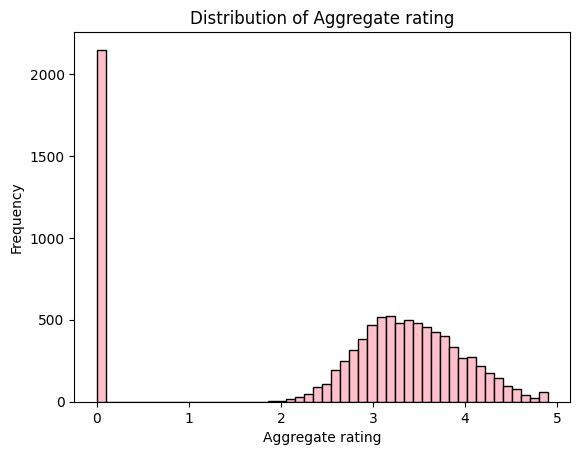

In [134]:
plt.hist(df['Aggregate rating'],bins=50,color='pink',edgecolor='black')
plt.xlabel('Aggregate rating')
plt.ylabel('Frequency')
plt.title('Distribution of Aggregate rating')
plt.show()

**Calculate the average number of votes
received by restaurants.**

In [135]:
avg=df['Votes'].mean()
print("The average number of votes received by restaurants is ",avg)

The average number of votes received by restaurants is  156.909747670401


# **TASK 2 : CUISINE COMBINATION**

**Identify the most common combinations of
cuisines in the dataset.**

In [136]:
common_combinations=df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
top_20=common_combinations.head(20)
print(common_combinations)
print()
print("Top 20 popular cuisine combinartions are :",top_20)

Cuisines
Italian, Deli                     4.9
Hawaiian, Seafood                 4.9
American, Sandwich, Tea           4.9
Continental, Indian               4.9
European, Asian, Indian           4.9
                                 ... 
Fast Food, Desserts, Beverages    0.0
Fast Food, Chinese, Burger        0.0
Cafe, French                      0.0
Seafood, Mughlai, North Indian    0.0
Fast Food, Mughlai, Armenian      0.0
Name: Aggregate rating, Length: 1825, dtype: float64

Top 20 popular cuisine combinartions are : Cuisines
Italian, Deli                      4.90
Hawaiian, Seafood                  4.90
American, Sandwich, Tea            4.90
Continental, Indian                4.90
European, Asian, Indian            4.90
European, Contemporary             4.90
European, German                   4.90
BBQ, Breakfast, Southern           4.90
American, Coffee and Tea           4.90
Sunda, Indonesian                  4.90
American, Burger, Grill            4.90
Mughlai, Lucknowi          

**Determine if certain cuisine combinations
tend to have higher ratings.**

In [137]:
max_rating=common_combinations.iloc[0]
print("The maximum rating is ",max_rating)

The maximum rating is  4.9


In [138]:
most_rated_cuisines=common_combinations.idxmax()
print("The most rated cuisine is ",most_rated_cuisines)

The most rated cuisine is  Italian, Deli


# **TASK 2 : GEOGRAPHICAL ANALYSIS**

**Plot the locations of restaurants on a
map using longitude and latitude
coordinates.**

In [139]:
print(df[['Longitude','Latitude']])


       Longitude   Latitude
0     121.027535  14.565443
1     121.014101  14.553708
2     121.056831  14.581404
3     121.056475  14.585318
4     121.057508  14.584450
...          ...        ...
9546   28.977392  41.022793
9547   29.041297  41.009847
9548   29.034640  41.055817
9549   29.036019  41.057979
9550   29.026016  40.984776

[9551 rows x 2 columns]


In [140]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load the world map
world_map = folium.Map(location=[0, 0], zoom_start=2)

# Assuming your restaurant data is in a DataFrame called 'data'
# Filter data if necessary (e.g., based on country, city, etc.)
# filtered_data = data[data['Country Code'].isin(['US', 'CA', 'MX'])]  # Example filter

# Create a MarkerCluster to handle large datasets efficiently
marker_cluster = MarkerCluster()

# Add markers to the cluster
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)

# Add the marker cluster to the map
marker_cluster.add_to(world_map)

# Display the map
world_map


**Identify any patterns or clusters of
restaurants in specific areas.**

In [141]:
from sklearn.cluster import KMeans
coords = df[['Longitude', 'Latitude']]
kmeans = KMeans(n_clusters=5)
kmeans.fit(coords)
labels = kmeans.predict(coords)
df['Cluster'] = labels
print(df.head(10))

   Restaurant ID                           Restaurant Name  Country Code  \
0        6317637                          Le Petit Souffle           162   
1        6304287                          Izakaya Kikufuji           162   
2        6300002                    Heat - Edsa Shangri-La           162   
3        6318506                                      Ooma           162   
4        6314302                               Sambo Kojin           162   
5       18189371                              Din Tai Fung           162   
6        6300781                                Buffet 101           162   
7        6301290                                   Vikings           162   
8        6300010  Spiral - Sofitel Philippine Plaza Manila           162   
9        6314987                                  Locavore           162   

               City                                            Address  \
0       Makati City  Third Floor, Century City Mall, Kalayaan Avenu...   
1       Makati 

# **TASK 4 : RESTAURANT CHAINS**

**Identify if there are any restaurant chains
present in the dataset.**

In [142]:
restaurant_chains=df.groupby("Restaurant Name").size().reset_index(name="OutletCount")
new=restaurant_chains[restaurant_chains["OutletCount"]>1]
restaurant_chains=new.sort_values(by="OutletCount",ascending=False)
restaurant_chains[['Restaurant Name','OutletCount']].head(10)

,Restaurant Name,OutletCount
1098,Cafe Coffee Day,83
2098,Domino's Pizza,79
6106,Subway,63
2716,Green Chick Chop,51
4077,McDonald's,48
3478,Keventers,34
4961,Pizza Hut,30
2619,Giani,29
680,Baskin Robbins,28
663,Barbeque Nation,26


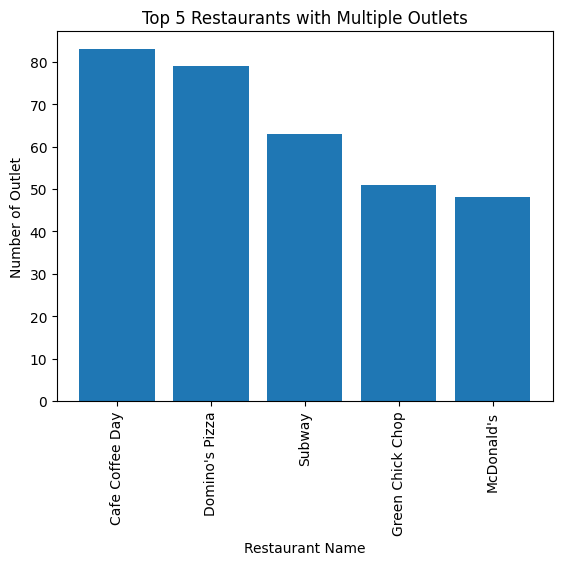

In [143]:
plt.bar(restaurant_chains['Restaurant Name'][:5],restaurant_chains['OutletCount'][:5])
plt.xlabel('Restaurant Name')
plt.ylabel('Number of Outlet')
plt.title('Top 5 Restaurants with Multiple Outlets')
plt.xticks(rotation=90)
plt.show()

**Analyze the ratings and popularity of
different restaurant chains.**

In [144]:
avg_ratings = df.groupby('Restaurant Name')['Aggregate rating'].mean().reset_index()
avg_ratings = avg_ratings.sort_values(by='Aggregate rating', ascending=False)
print(avg_ratings.head(10))
print()
# Group by 'Restaurant Name' and calculate the total 'Votes'
total_votes = df.groupby('Restaurant Name')['Votes'].sum().reset_index()
# Sort the total votes in descending order
total_votes = total_votes.sort_values(by='Votes', ascending=False)
# Print the top 10 most popular restaurant chains
print(total_votes.head(10))

                     Restaurant Name  Aggregate rating
5322  Restaurant Mosaic @ The Orient               4.9
4177                Ministry of Crab               4.9
4135                           Miann               4.9
5757         Shorts Burger and Shine               4.9
4165                           Milse               4.9
7339                 Yellow Dog Eats               4.9
2133                   Duck & Waffle               4.9
2559                    Gaga Manjero               4.9
4182                 Mirchi And Mime               4.9
4078   McGuire's Irish Pub & Brewery               4.9

                Restaurant Name  Votes
663             Barbeque Nation  28142
101   AB's - Absolute Barbecues  13400
6943                       Toit  10934
785                   Big Chill  10853
2297                 Farzi Cafe  10098
6988                   Truffles   9682
1510                    Chili's   8156
2879           Hauz Khas Social   7931
3261               Joey's Pizza   7807
4902

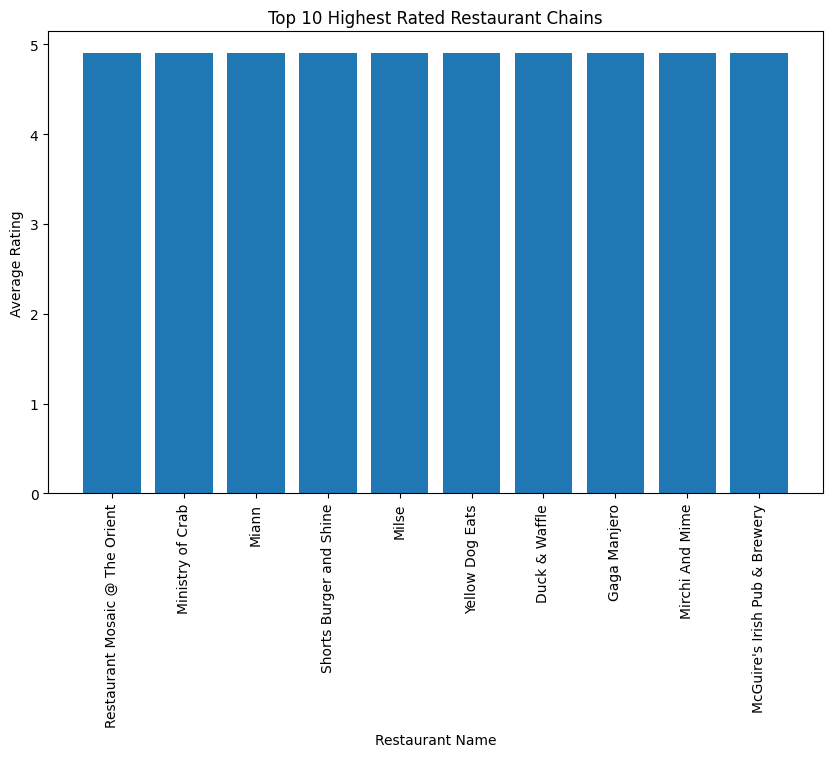

In [145]:
# Plot a bar chart to visualize the top 10 highest rated restaurant chains
plt.figure(figsize=(10,6))
plt.bar(avg_ratings['Restaurant Name'].head(10), avg_ratings['Aggregate rating'].head(10))
plt.xlabel('Restaurant Name')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.title('Top 10 Highest Rated Restaurant Chains')
plt.show()

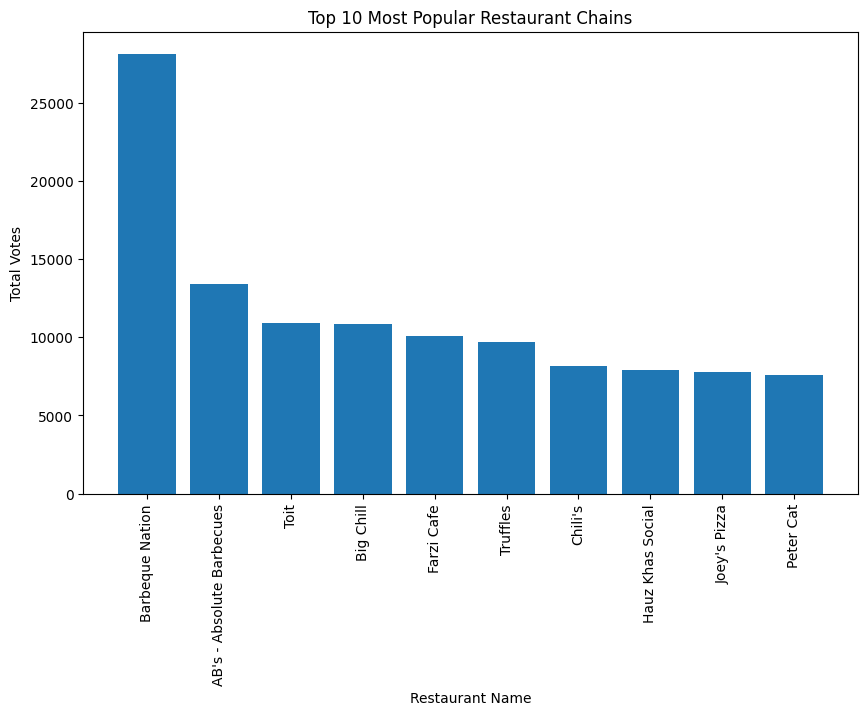

In [146]:
# Plot a bar chart to visualize the top 10 most popular restaurant chains
plt.figure(figsize=(10,6))
plt.bar(total_votes['Restaurant Name'].head(10), total_votes['Votes'].head(10))
plt.xlabel('Restaurant Name')
plt.ylabel('Total Votes')
plt.xticks(rotation=90)
plt.title('Top 10 Most Popular Restaurant Chains')
plt.show()